Load required libraries

In [1]:
from netCDF4 import Dataset, num2date
import numpy as np
import pandas as pd
import xarray as xr
import os
import time
import matplotlib.pyplot as plt
import matplotlib
import gc
from matplotlib import transforms
import matplotlib.colors as clrs
import glob

Load in observation data

In [2]:
for i in np.arange(0,12):
    filename = "/gpfs/fs7/dfo/hpcmc/comda/stod000/DATA/WOD/NO3/nitrate_wod_monthly_"+str(i+1)+"_CREG025.nc"
    data = Dataset(filename, "r", format="NETCDF4")
    X = data.variables['Nitrate'][:]
    if i==0:
        [nz,ny,nx]=np.shape(X)
        obs=np.zeros((12,nz,ny,nx))
        obsNO3=np.transpose(obs,(0,3,1,2))
        print(np.shape(obsNO3))
        #[nz,ny,nx]=np.shape(X)
        [nt,nz,ny,nx] = np.shape(obsNO3)
    obsNO3[i,:,:,:]=np.transpose(X,(2,0,1))

print(type(obsNO3))
print(np.shape(obsNO3))
print(np.nanmin(obsNO3), np.nanmax(obsNO3), np.nanmean(obsNO3))

/tmp/ipykernel_598046/2502604247.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X = data.variables['Nitrate'][:]


(12, 75, 735, 528)
<class 'numpy.ndarray'>
(12, 75, 735, 528)
0.0009756098152138293 1453.6586100260417 12.551335043473813


Load region mask and CREG025 mask

In [3]:
data_file = Dataset("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/regions_mask_6.nc", "r", format="NETCDF4")
regindx = (data_file['regions_mask'][:])
print(regindx.shape)

data_file = Dataset("/home/fid000/WORK7/ANALYSIS/DATA/CREG025_mesh_mask.nc", "r", format="NETCDF4")
tmask = (data_file['tmask'][0,:,:,:])
print(tmask.shape)

print(np.nanmin(regindx),np.nanmean(regindx),np.nanmax(regindx))
print(np.min(tmask),np.mean(tmask),np.max(tmask))

tmask0=tmask[0,:,:].squeeze()

nxy=np.size(regindx)
I = np.reshape(regindx, (nxy,))
nreg=int(max(I))
mask = regindx
mask = mask.flatten()

(735, 528)
(75, 735, 528)
0.0 2.0095472683383417 9.0
0 0.3011297327011613 1


/tmp/ipykernel_598046/2096643997.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  regindx = (data_file['regions_mask'][:])
/tmp/ipykernel_598046/2096643997.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tmask = (data_file['tmask'][0,:,:,:])


Output scatterplots of model vs obs for month and regions

/tmp/ipykernel_155426/2673136974.py:35: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


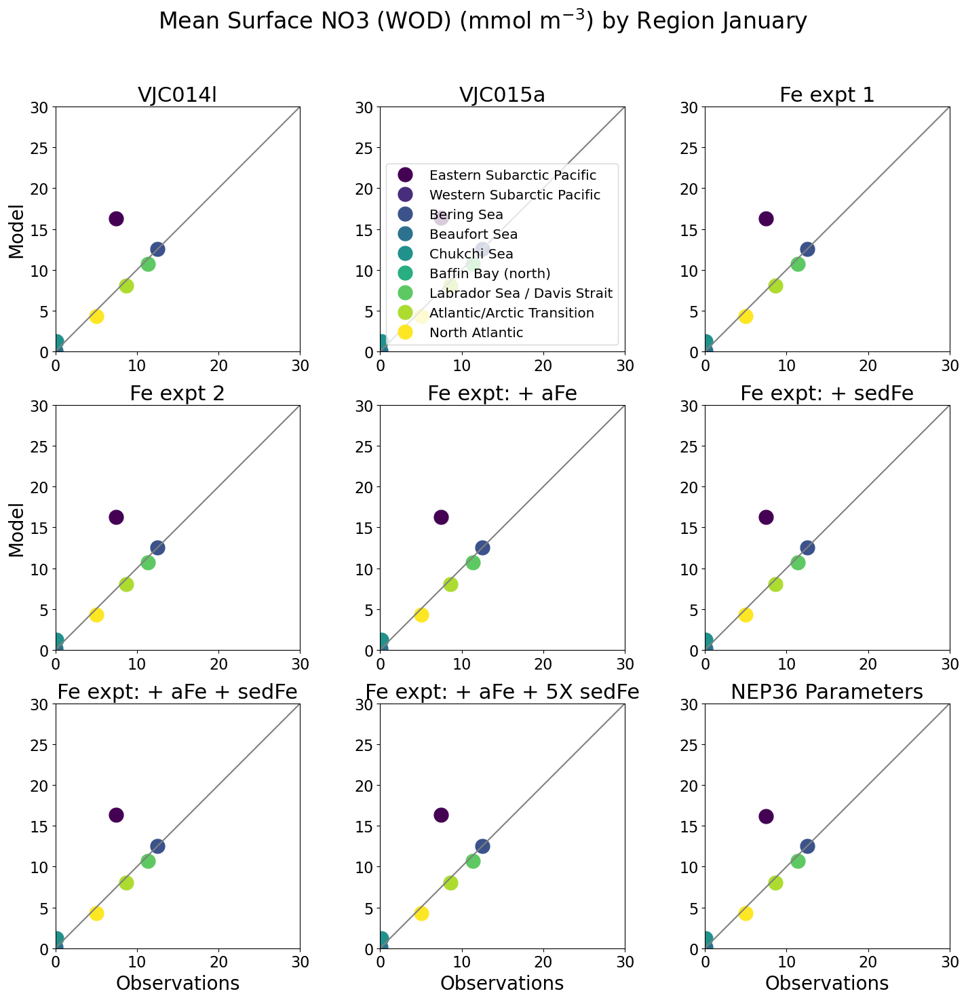

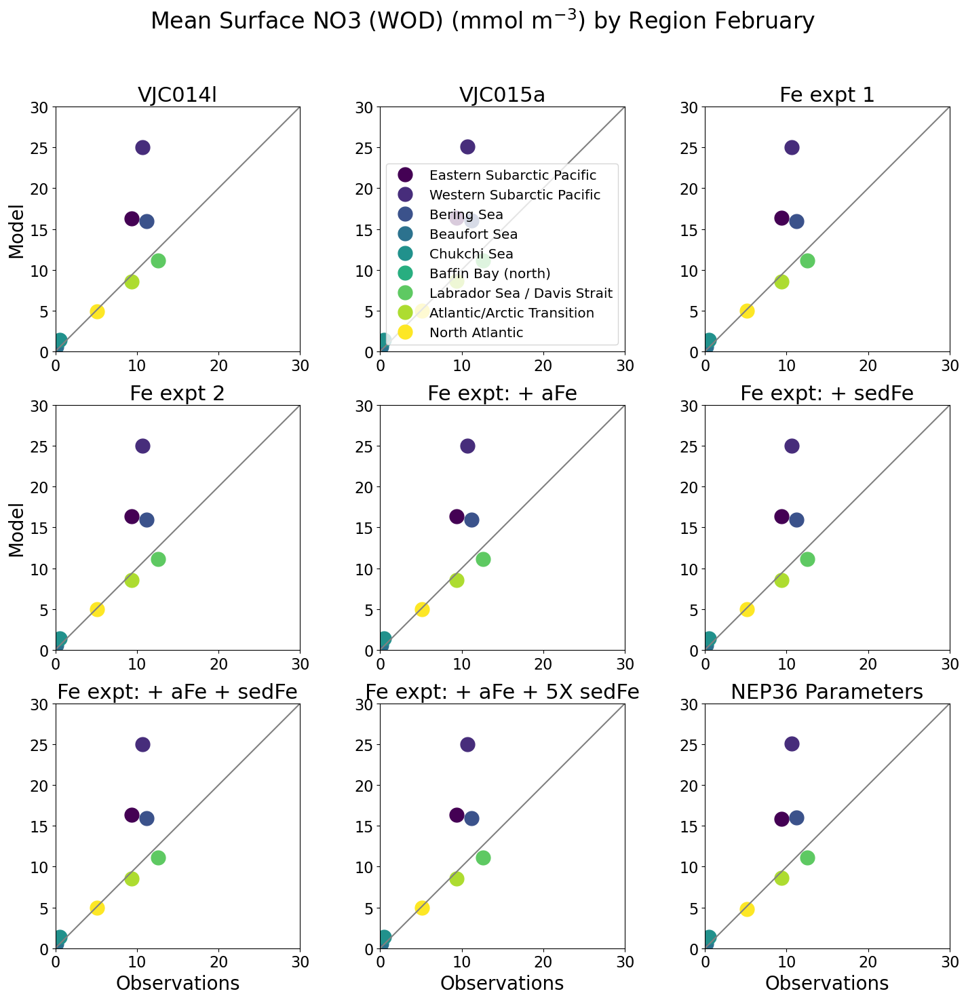

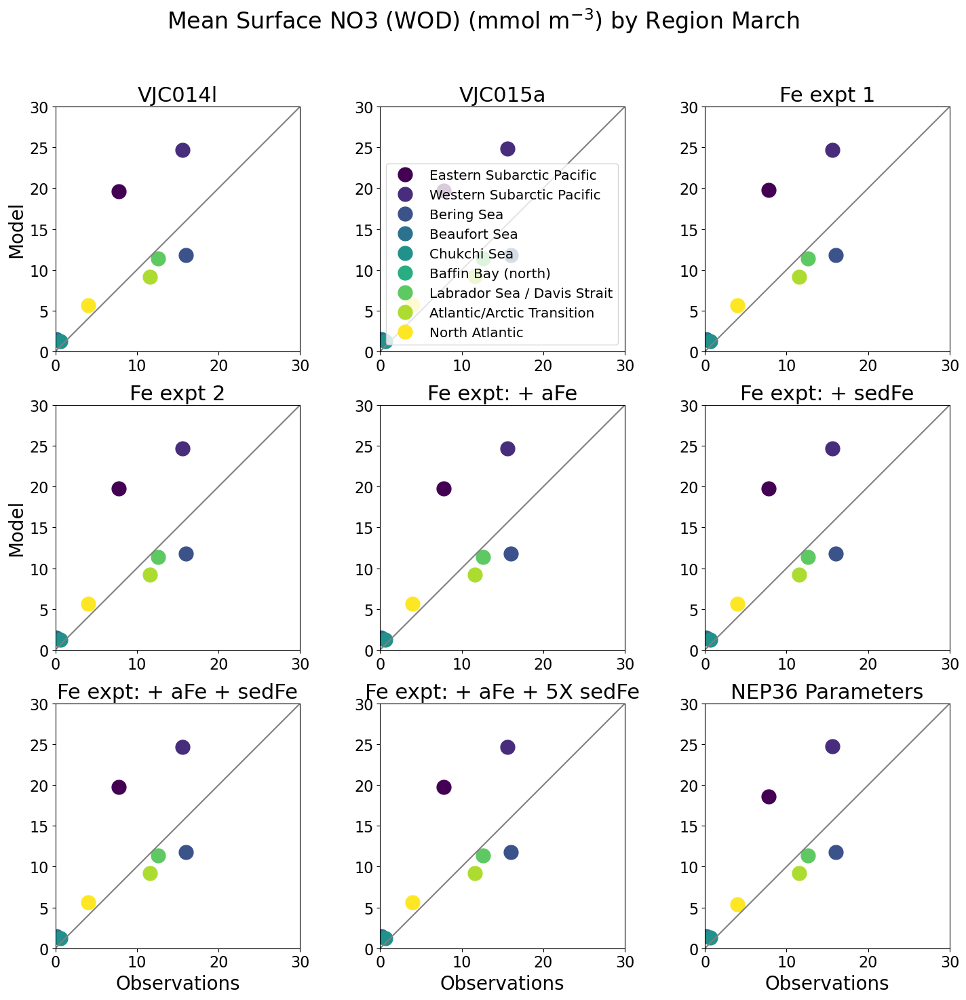

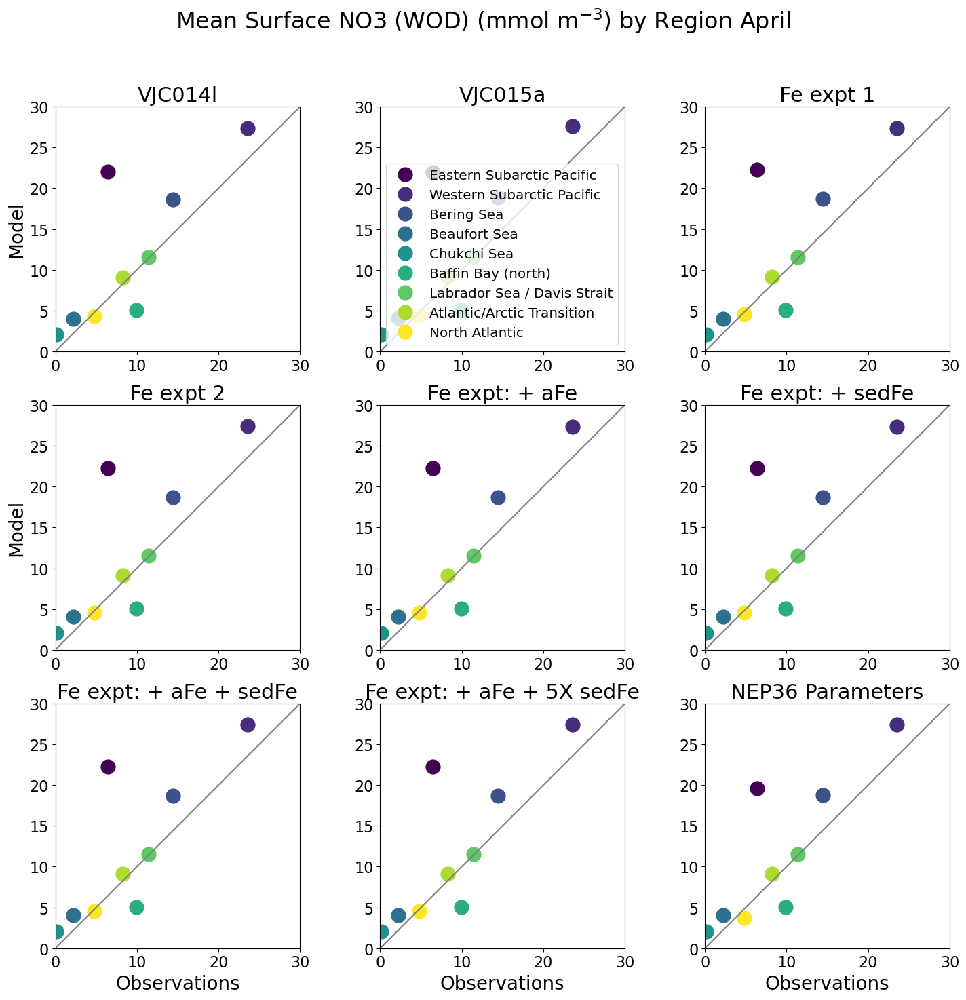

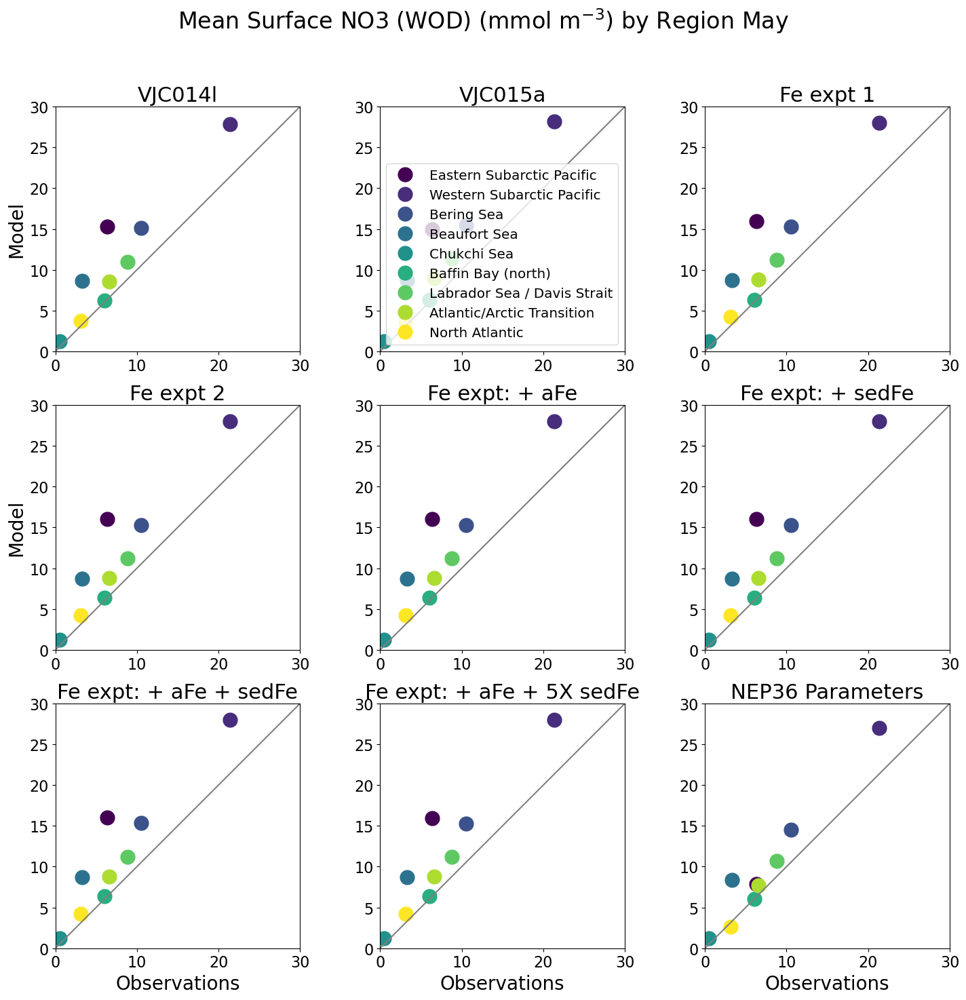

...

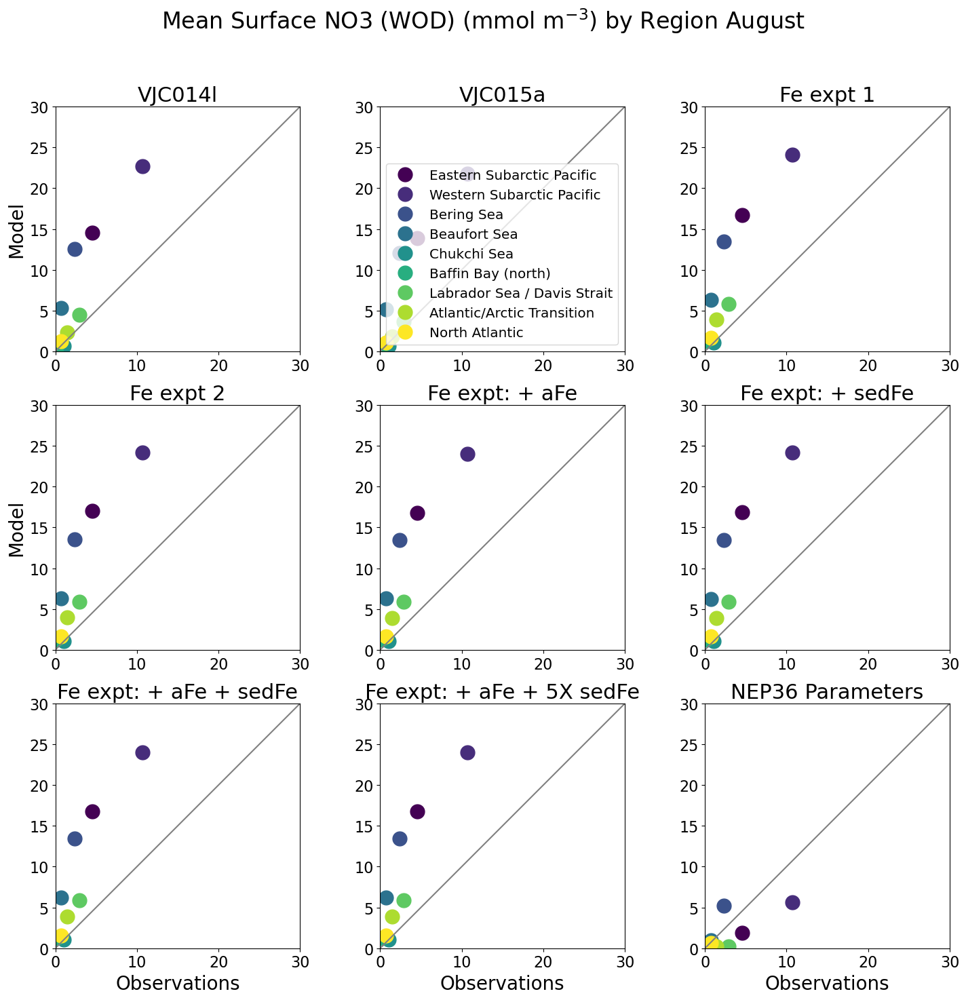

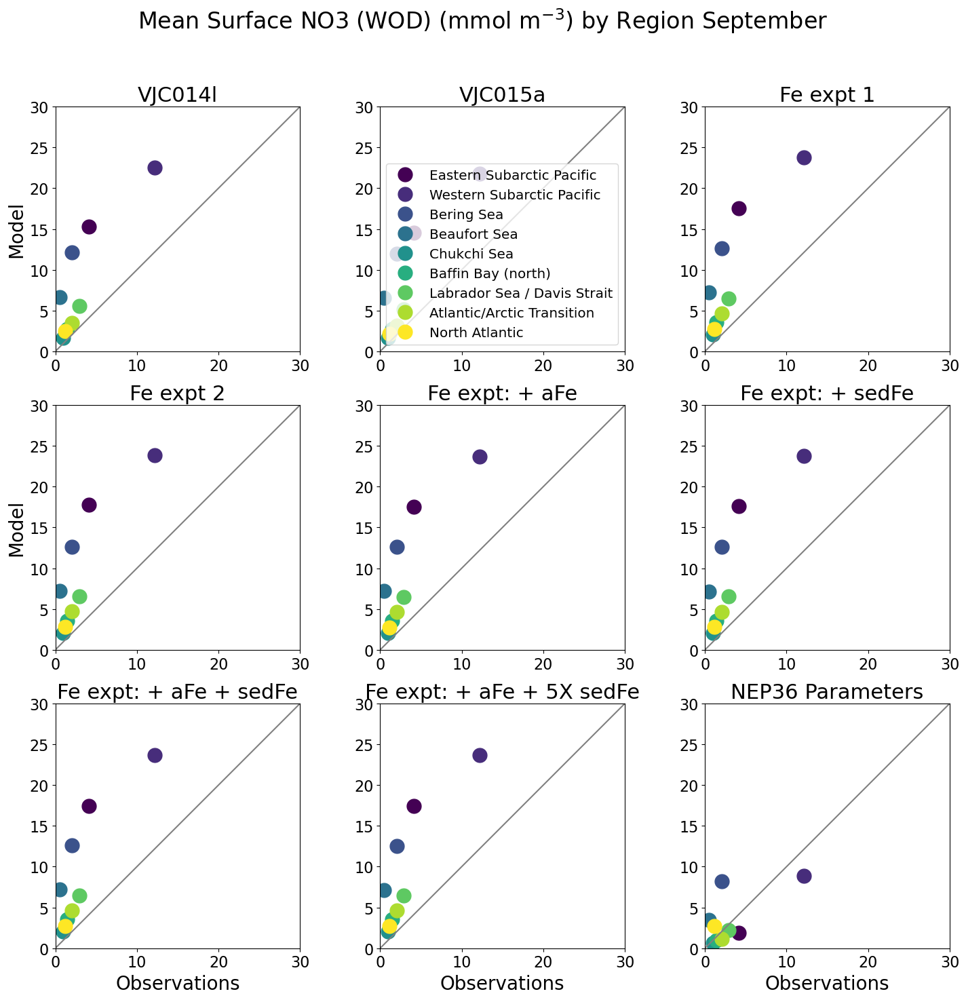

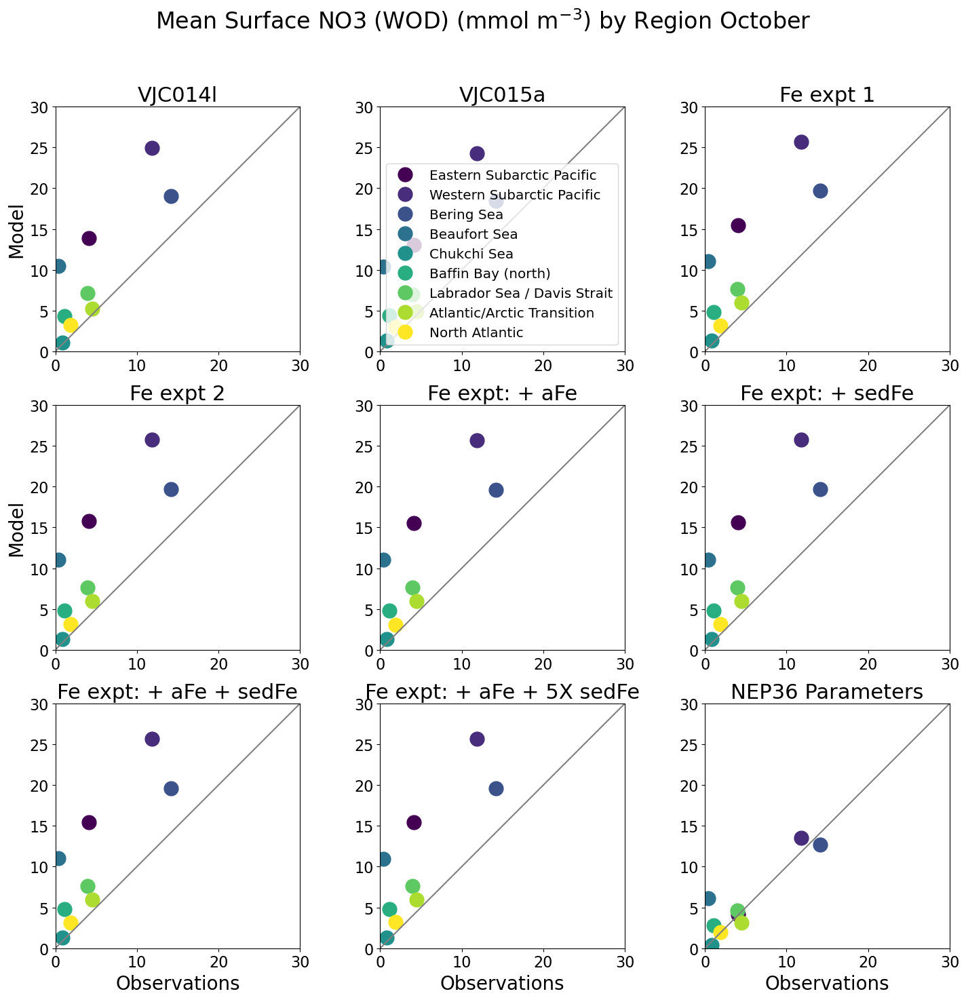

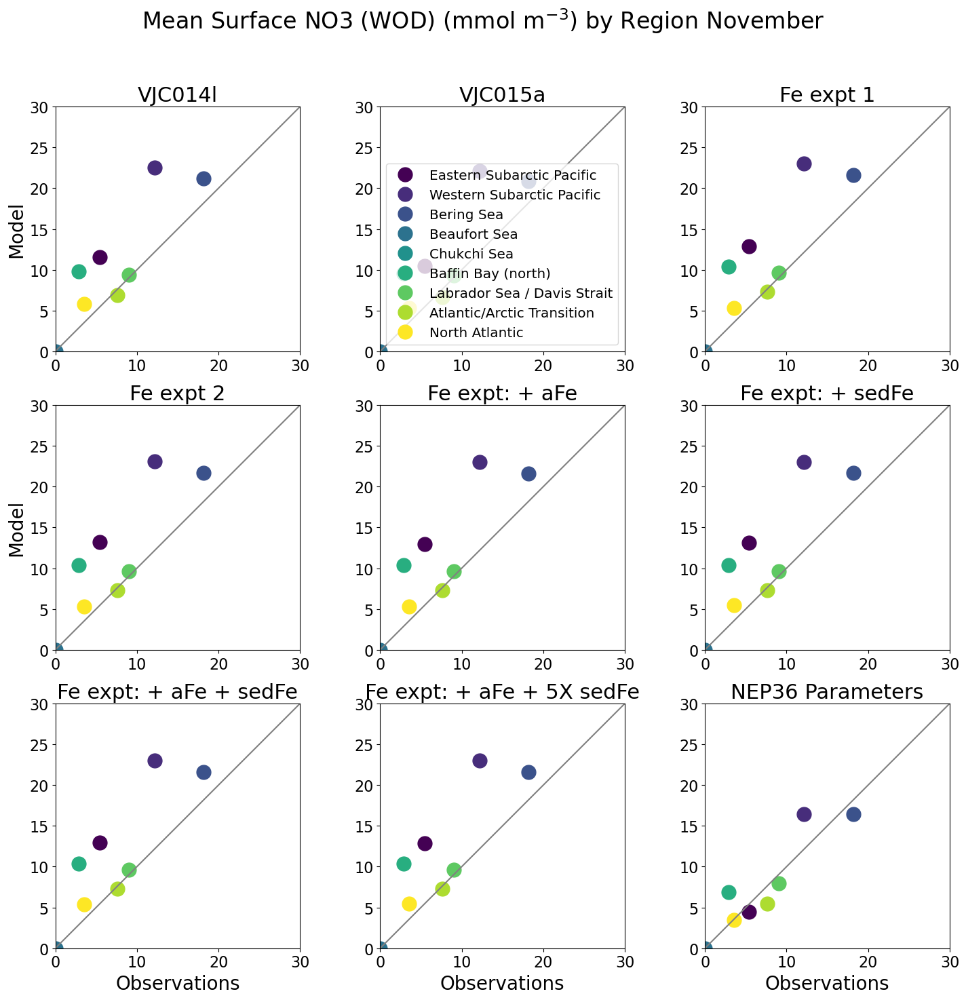

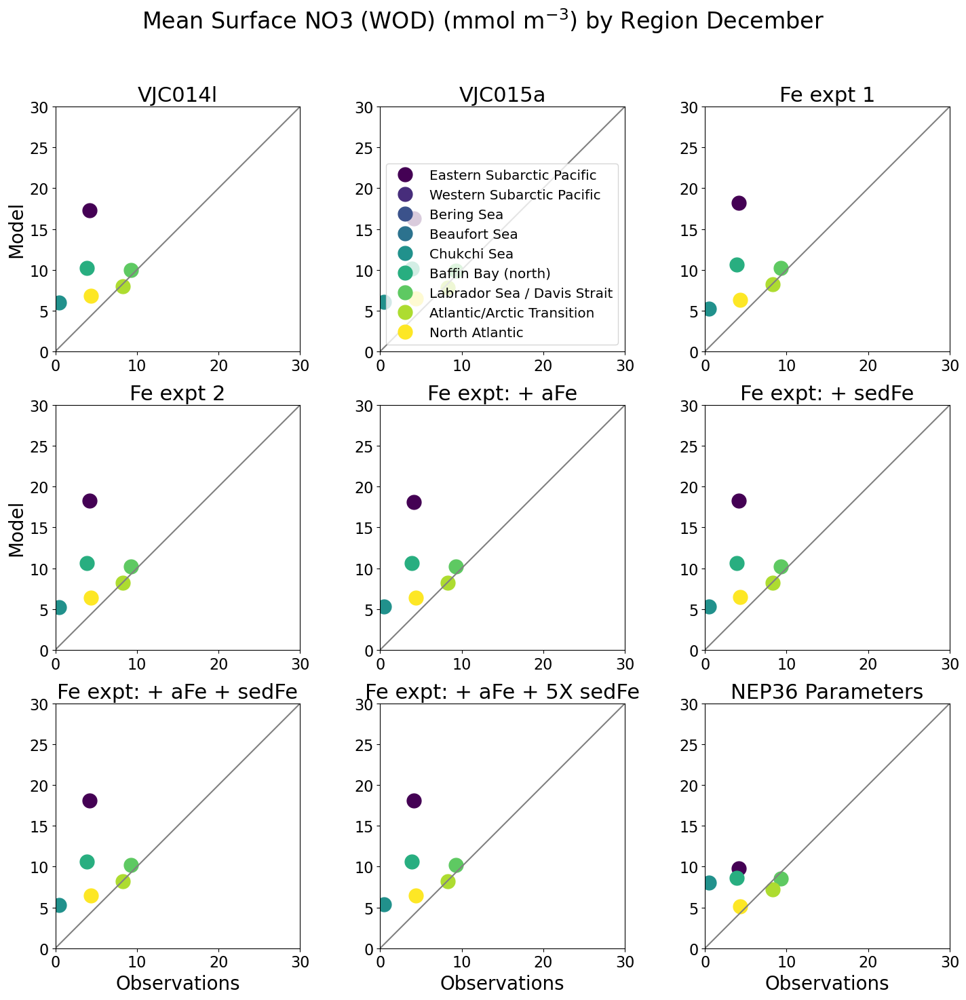

In [7]:
# Presentation quality plot for BioMod Workshop

regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['-VJC014l','-VJC015a','-VJC015oi','-VJC015ol','-VJC015on','-VJC015or','-VJC015os','-VJC015ot','-VJCnep01']
variantdict = ['VJC014l','VJC015a','Fe expt 1','Fe expt 2','Fe expt: + aFe','Fe expt: + sedFe','Fe expt: + aFe + sedFe',
               'Fe expt: + aFe + 5X sedFe','NEP36 Parameters']

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))
    fig.suptitle('Mean Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24) 
    #fig.suptitle('Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24)
    for a, asuff in enumerate(variants):
        cx=plt.subplot(3,3, a+1)
        runid = str('CREG025_LIM3_CANOE'+asuff)
        #print(runid)
        data_all=np.zeros((12,nz,ny,nx))
        flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/NO3/"+runid+"_monthly_NO3.nc")
        flist.sort()
        #print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot

        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modNO3 = data.variables['NO3'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsNO3[im,iz,:,:].squeeze().flatten()
                XMOD=modNO3[im,iz,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                #plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=regions)

                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
            
            plt.xlim([0, 30]); plt.ylim([0,30])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
            plt.title(variantdict[a], fontsize=22)

            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='x-large', loc = 'lower right')
                
            if (a == 0) or (a == 3):
                plt.ylabel("Model", fontsize=20)

            if (a == 6) or (a == 7) or (a == 8):
                plt.xlabel("Observations", fontsize=20)

        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/NO3_WOD_FE/NO3_WOD_means_month"+str("{:02d}".format(im+1)))
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/NO3_WOD_FE/NO3_WOD_month"+str("{:02d}".format(im+1)))

/tmp/ipykernel_15350/541456658.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/fid000/WORK7/software/anaconda3/envs/pypkg/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


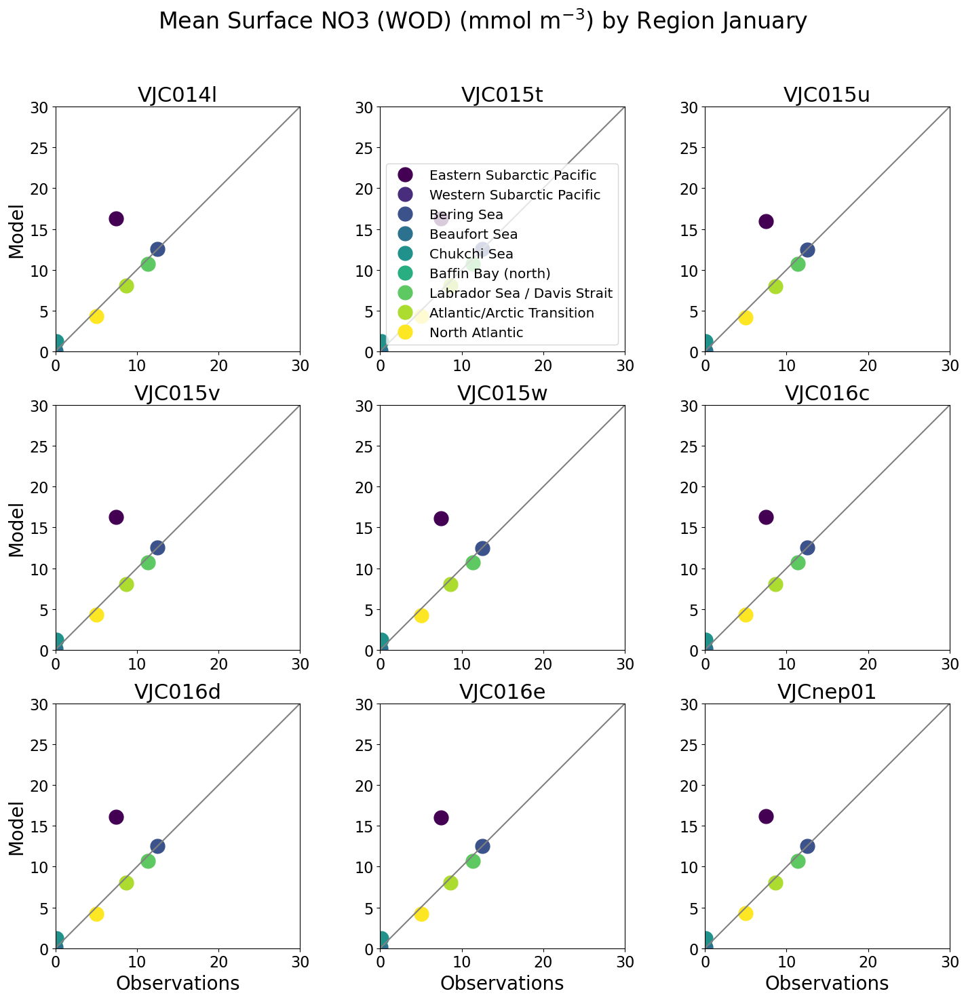

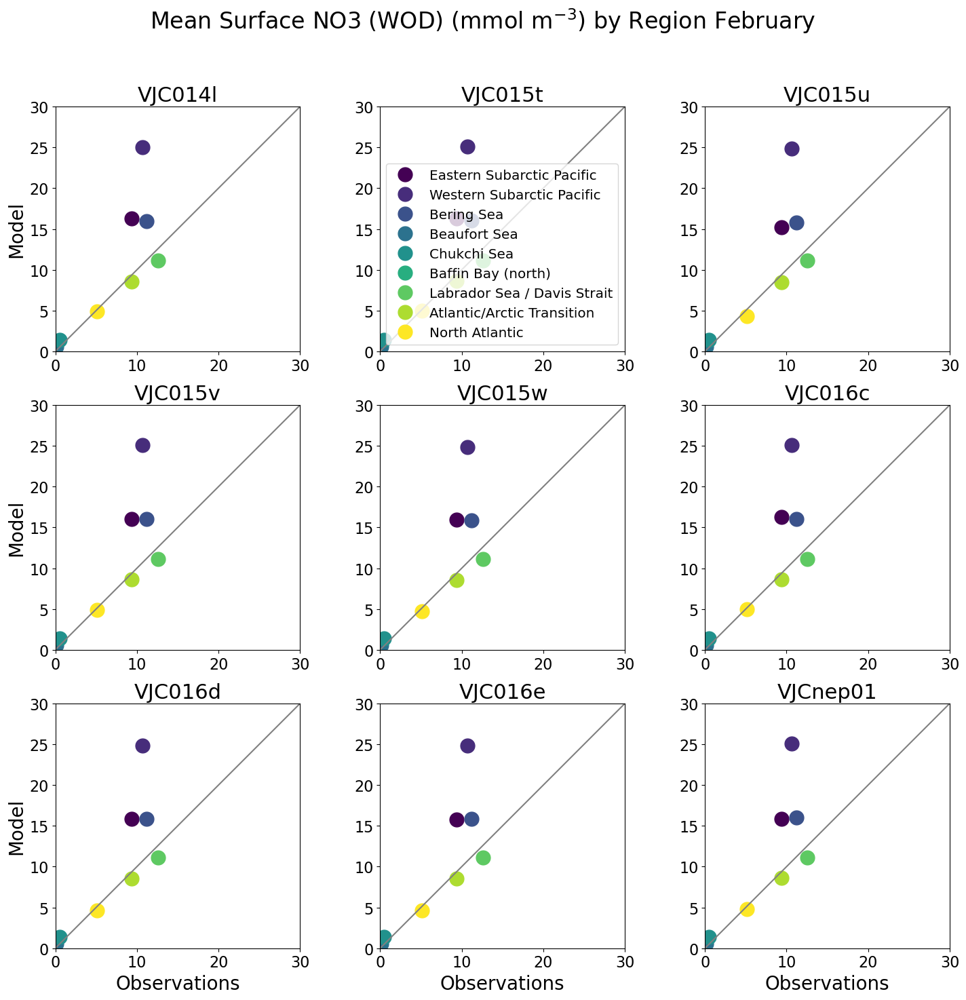

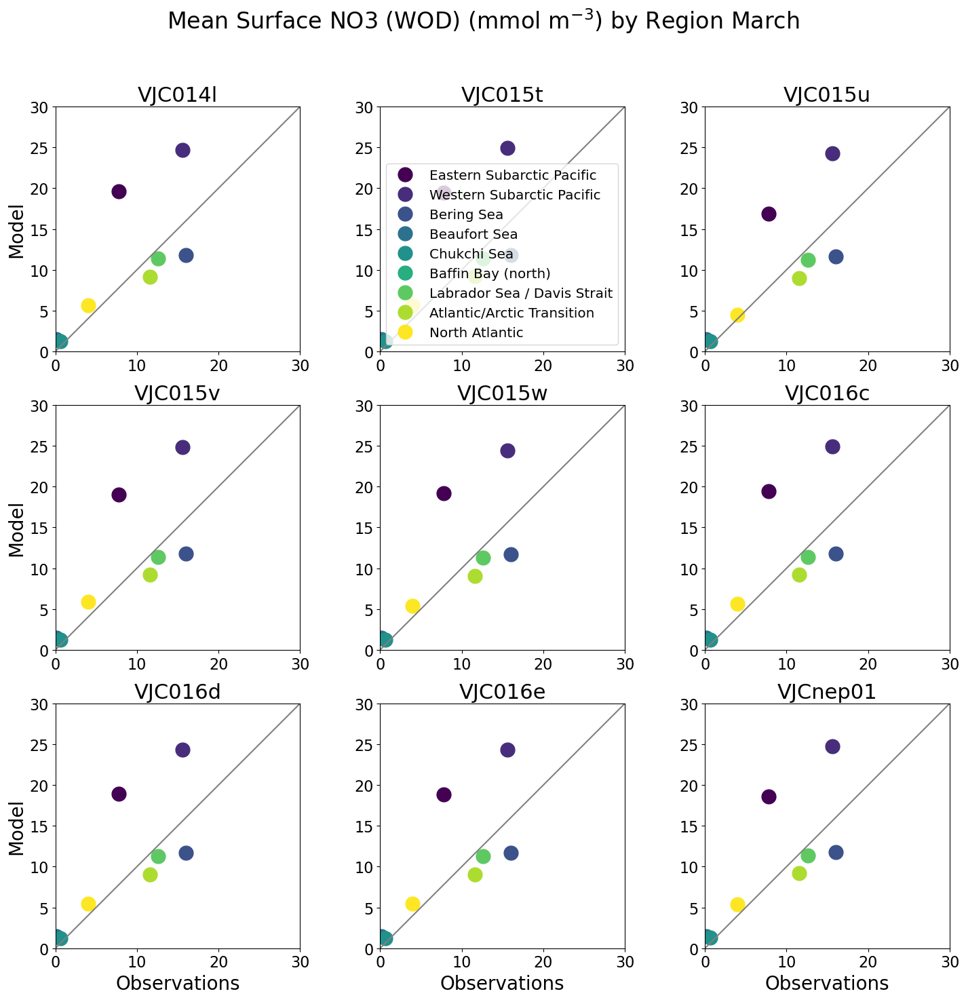

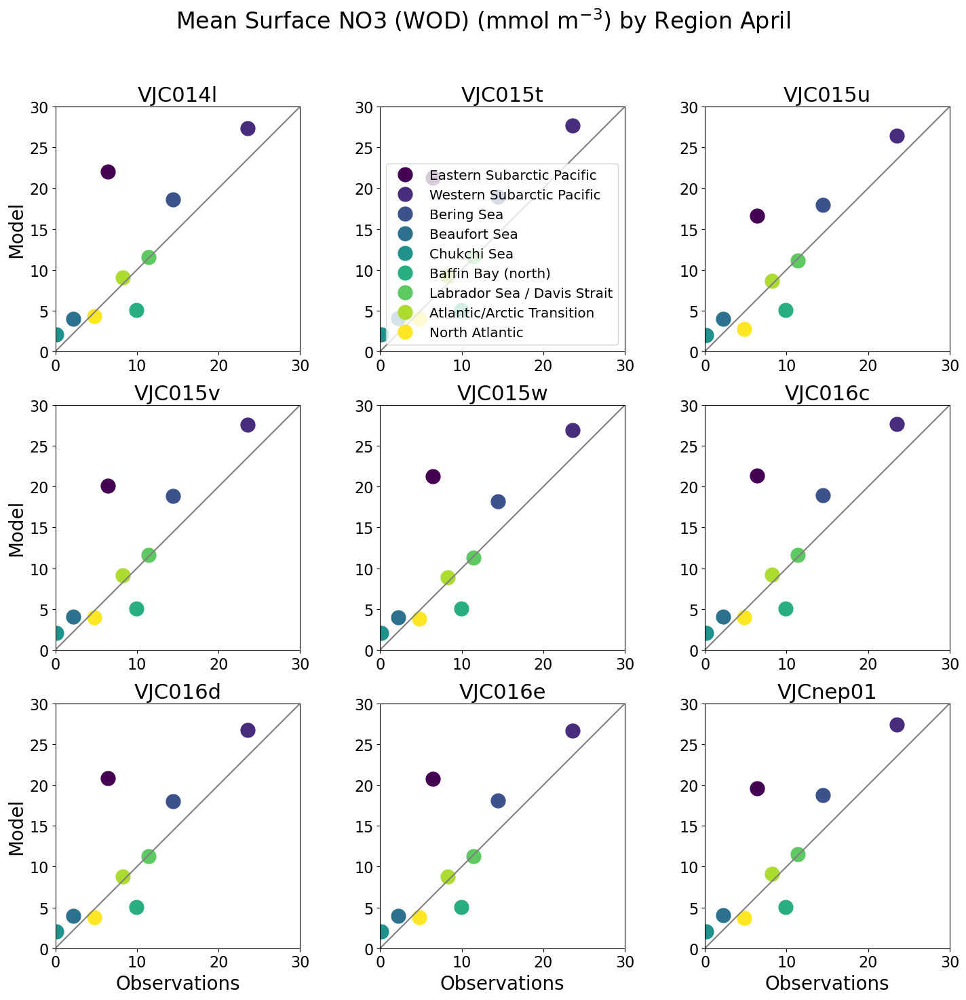

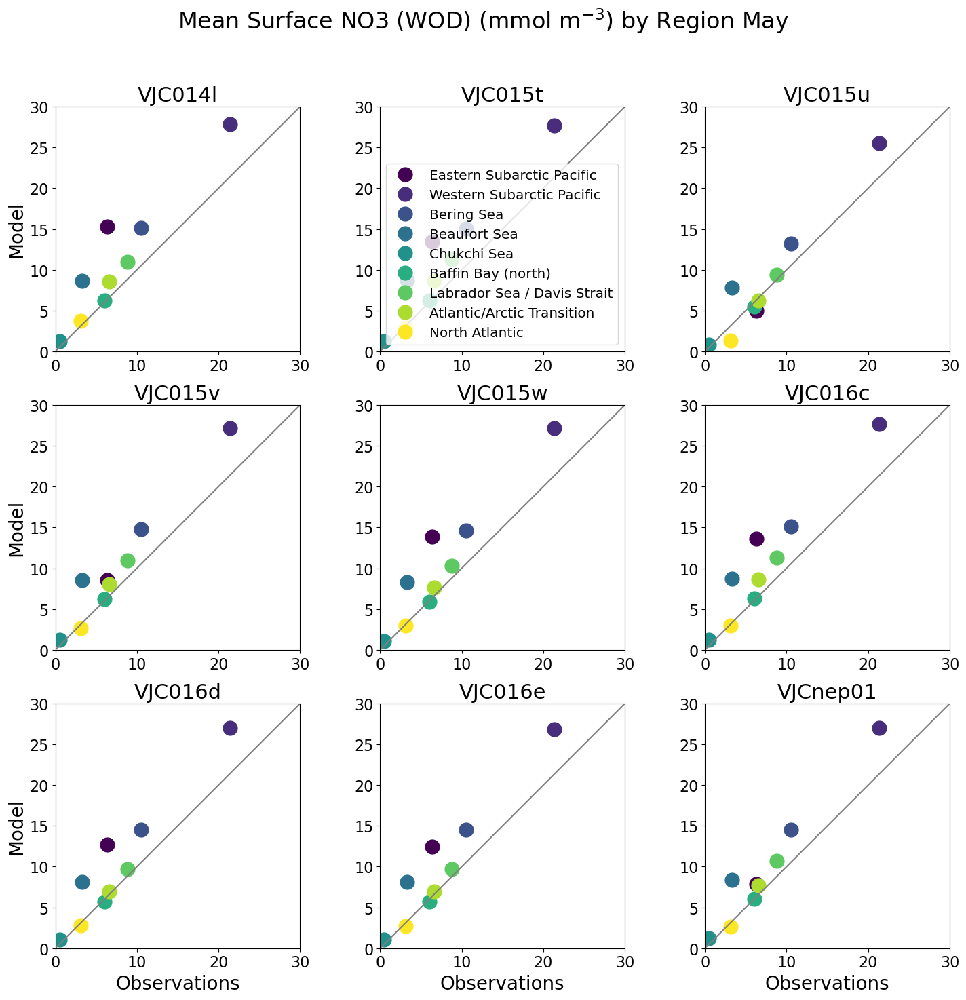

...

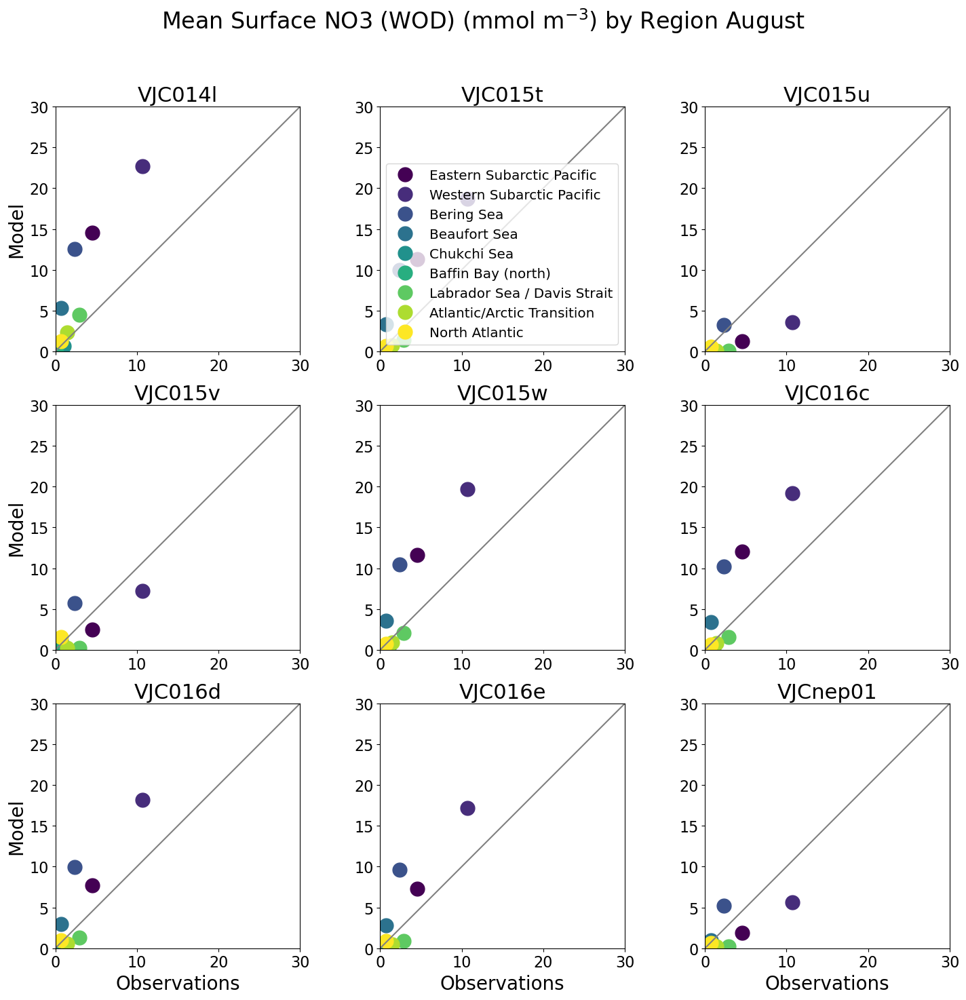

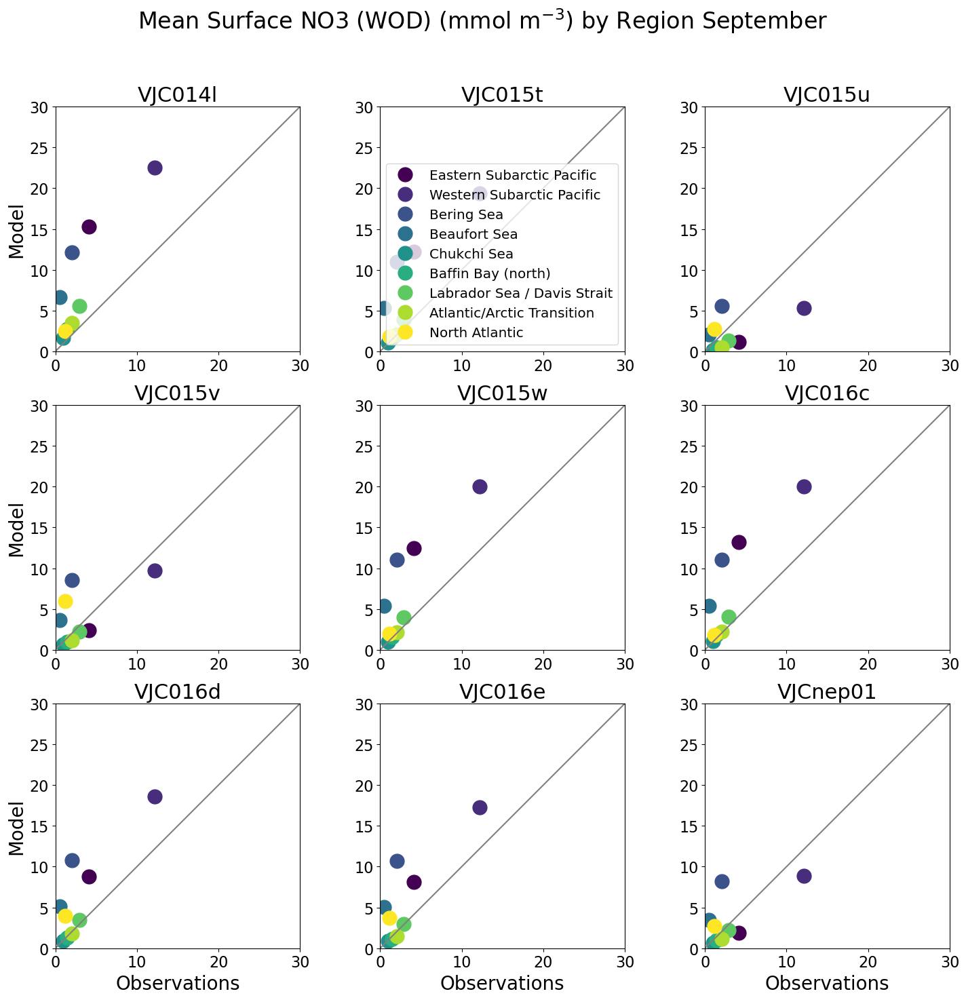

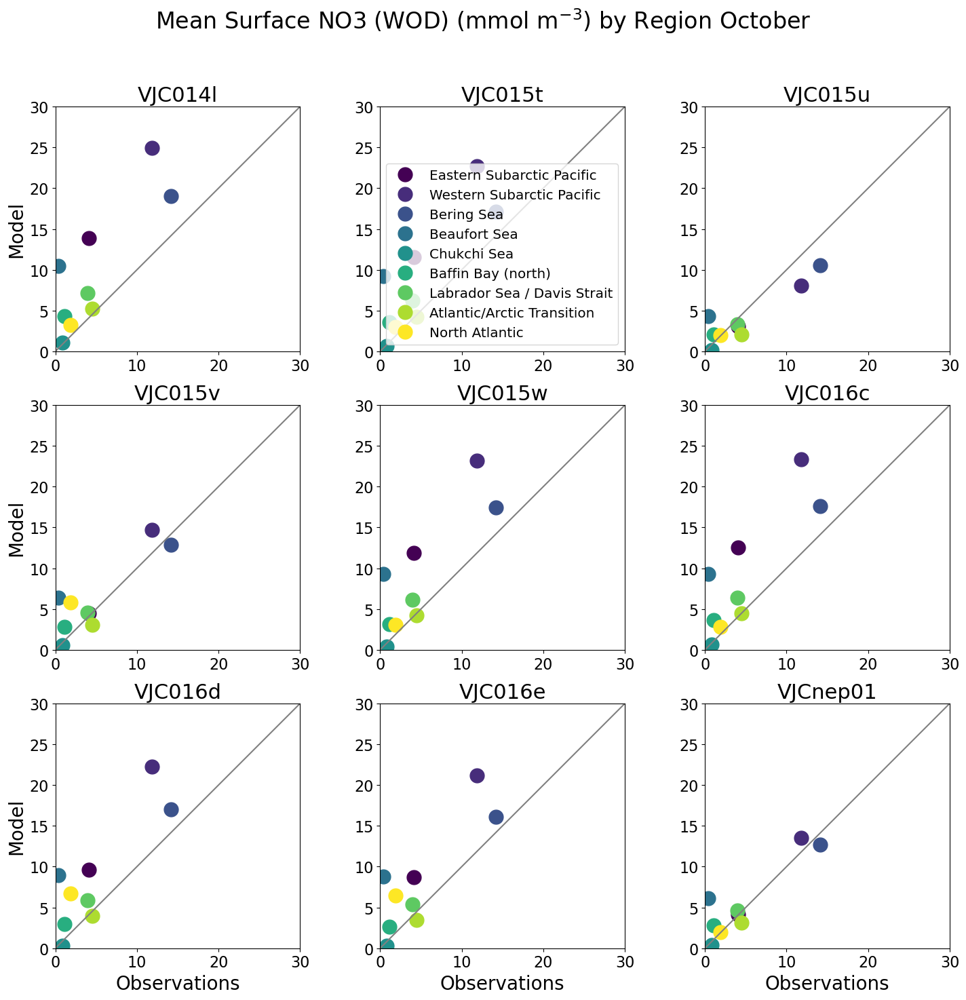

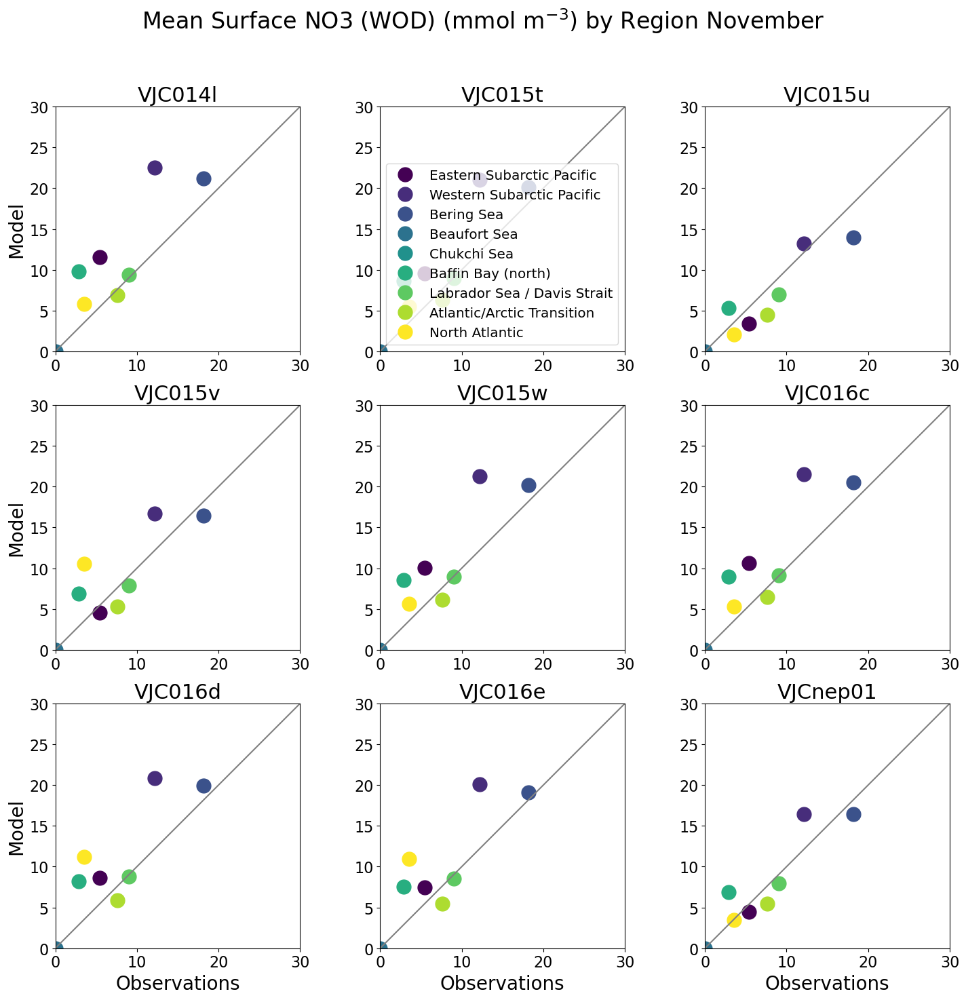

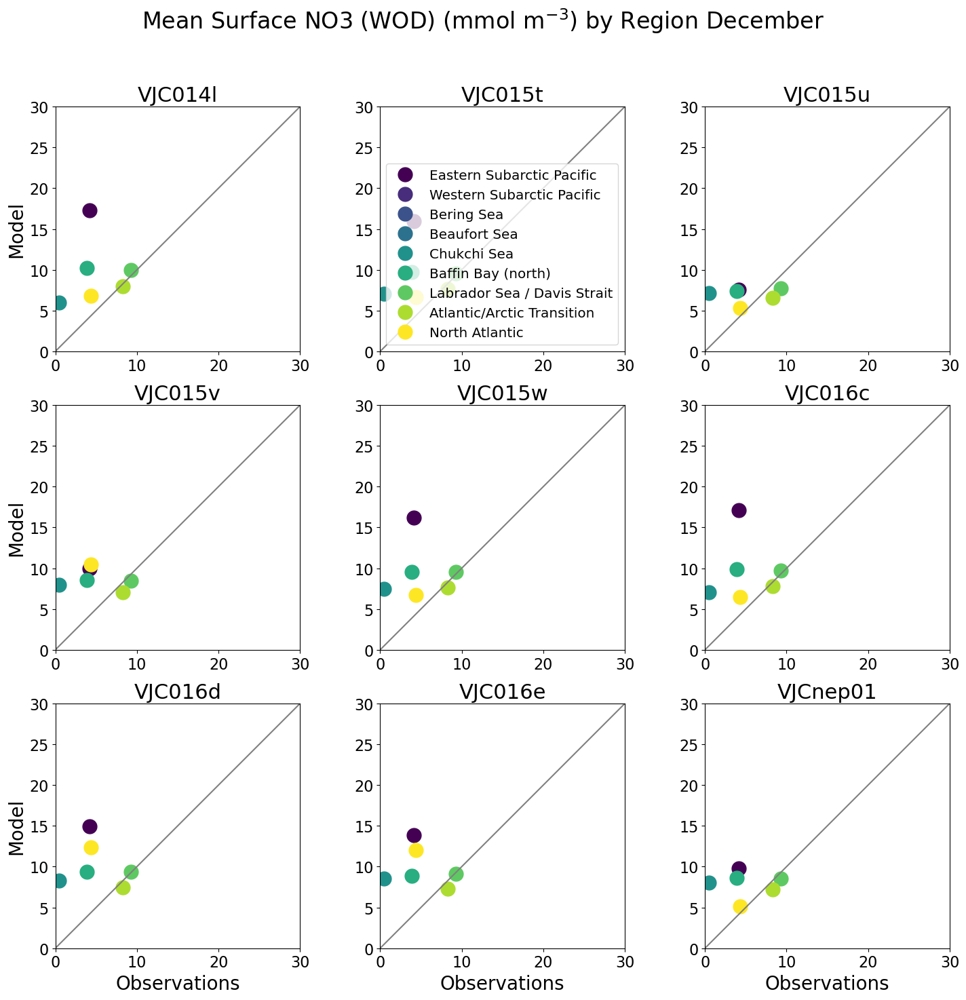

In [12]:
# Presentation quality plot for BioMod Workshop, 016c and d

regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJCnep01']
variantdict = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJCnep01']

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))
    fig.suptitle('Mean Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24) 
    #fig.suptitle('Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24)
    for a, asuff in enumerate(variants):
        cx=plt.subplot(3,3, a+1)
        runid = str('CREG025_LIM3_CANOE-'+asuff)
        #print(runid)
        data_all=np.zeros((12,nz,ny,nx))
        flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/NO3/"+runid+"_monthly_NO3.nc")
        flist.sort()
        #print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot

        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modNO3 = data.variables['NO3'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsNO3[im,iz,:,:].squeeze().flatten()
                XMOD=modNO3[im,iz,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                #plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=regions)

                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
            
            plt.xlim([0, 30]); plt.ylim([0,30])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
            plt.title(variantdict[a], fontsize=22)

            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='x-large', loc = 'lower right')
                
            if (a == 0) or (a == 3) or (a == 6):
                plt.ylabel("Model", fontsize=20)

            if (a == 6) or (a == 7) or (a == 8):
                plt.xlabel("Observations", fontsize=20)

        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcde/NO3_WOD/NO3_WOD_means_month"+str("{:02d}".format(im+1)))
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcde/NO3_WOD/NO3_WOD_month"+str("{:02d}".format(im+1)))

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

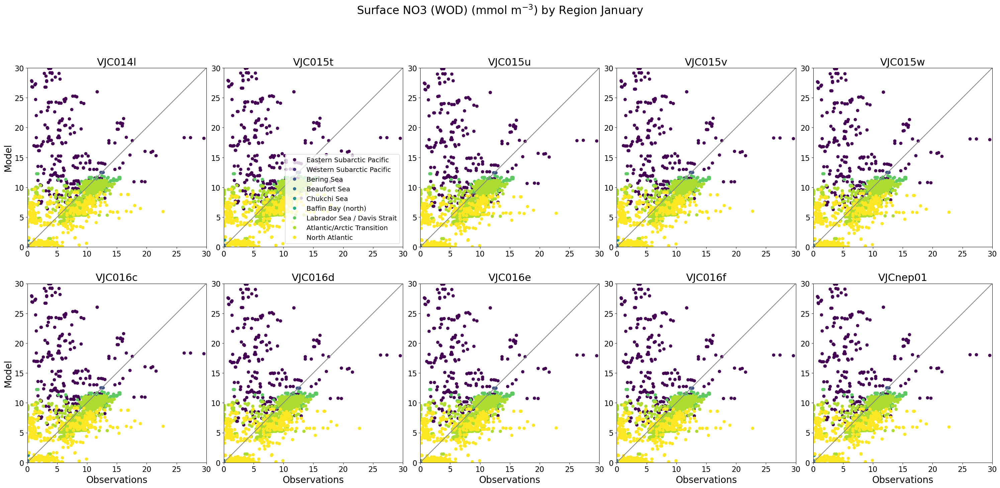

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

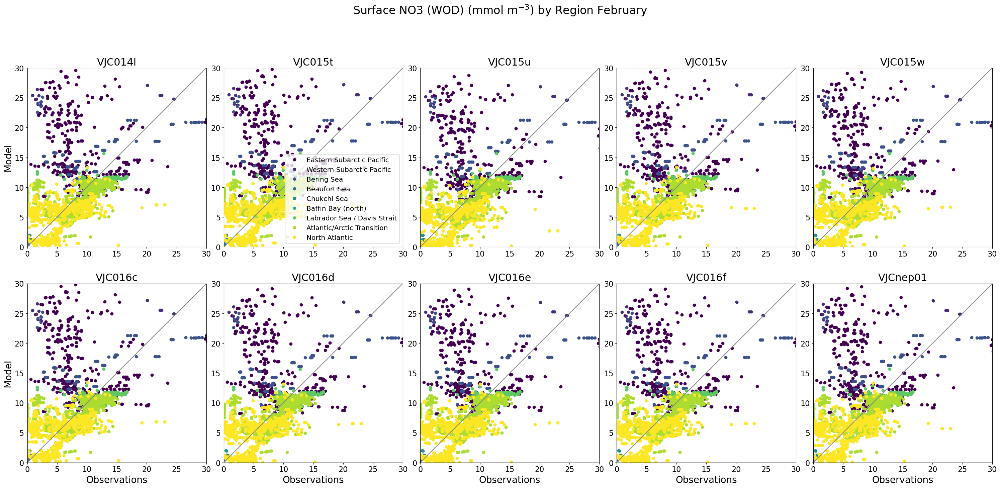

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

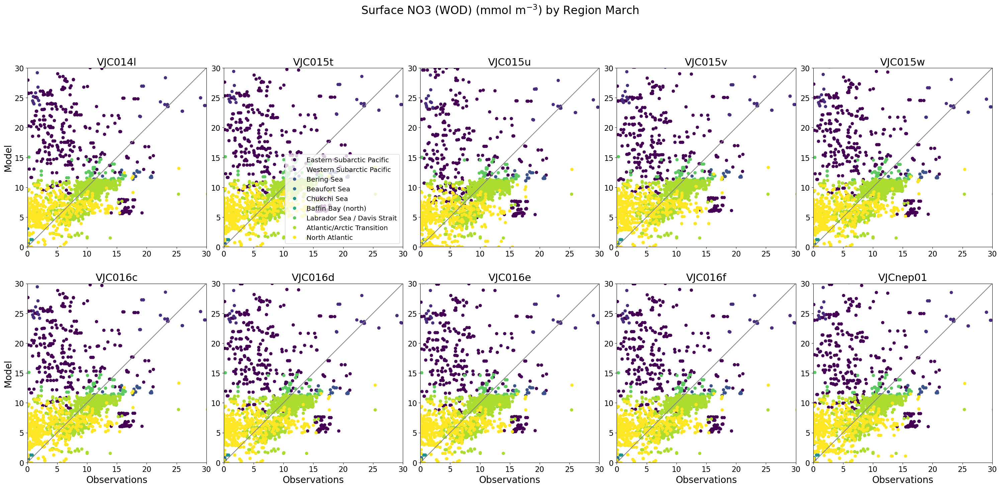

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

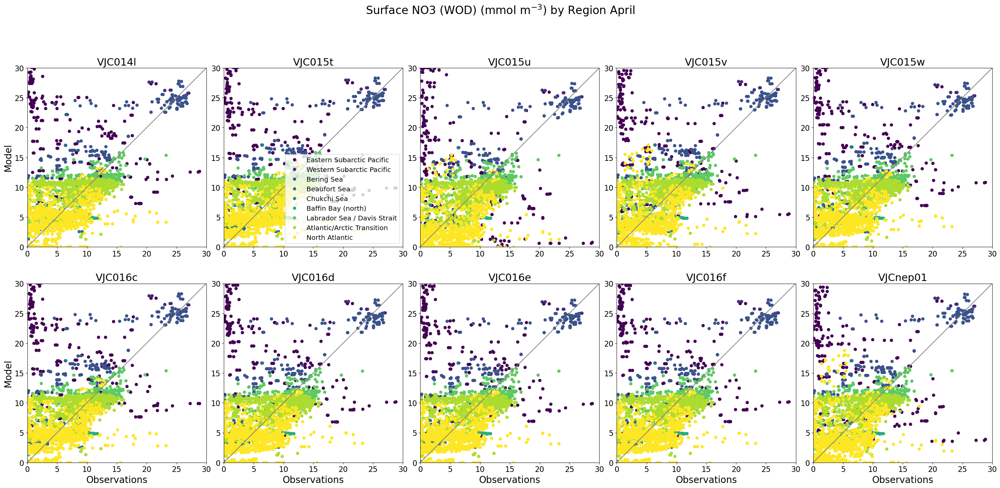

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

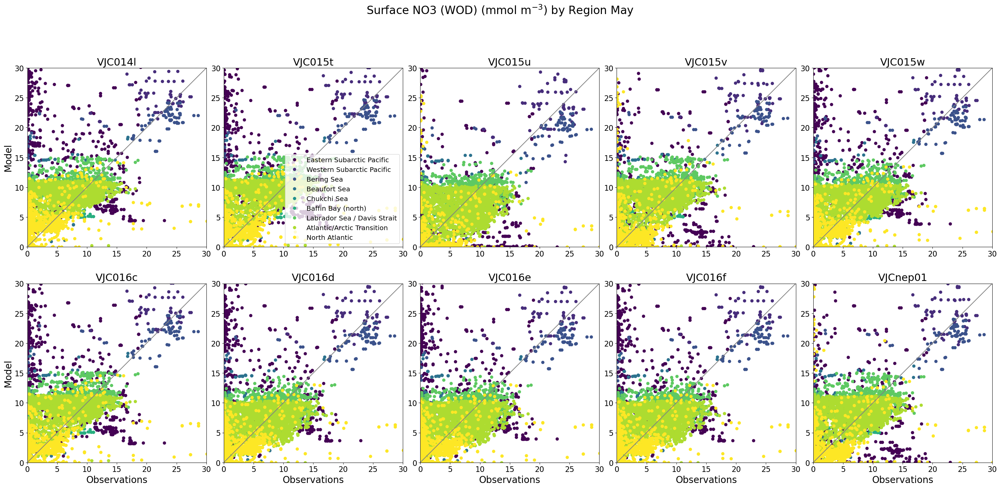

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

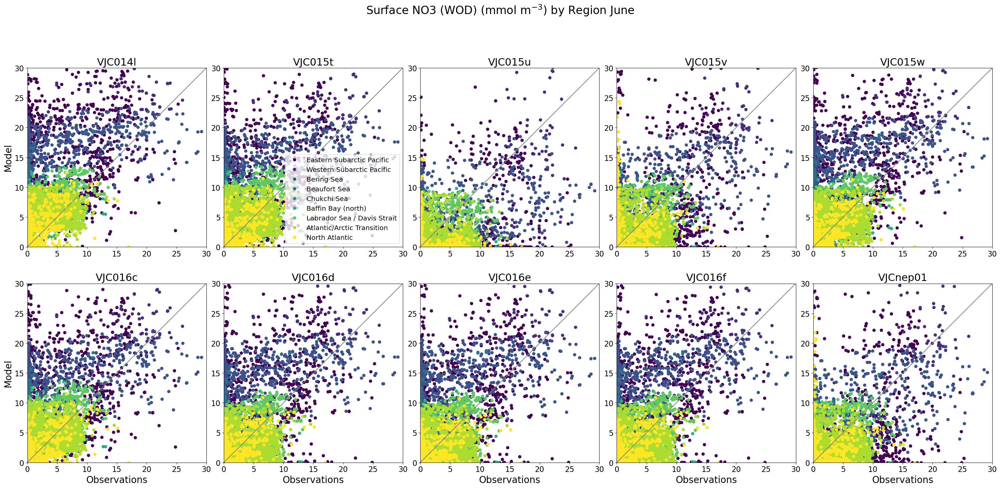

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

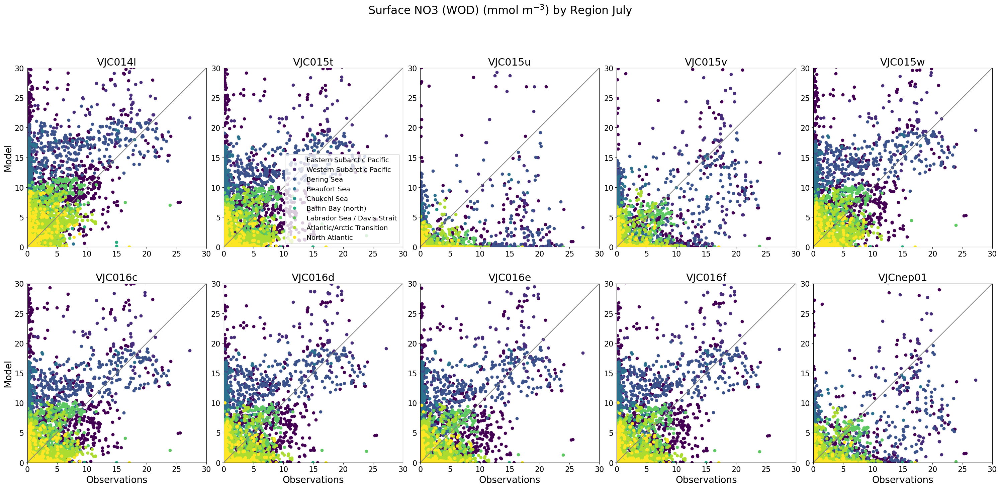

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

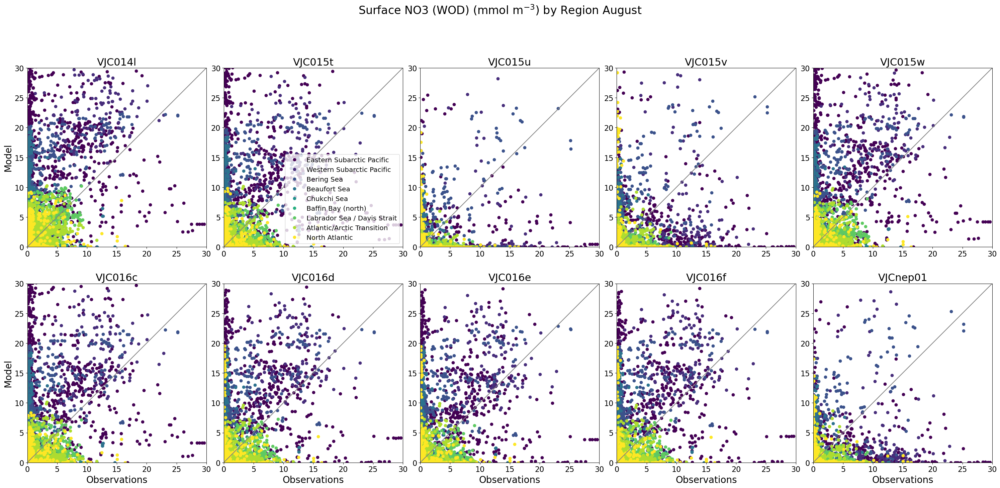

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

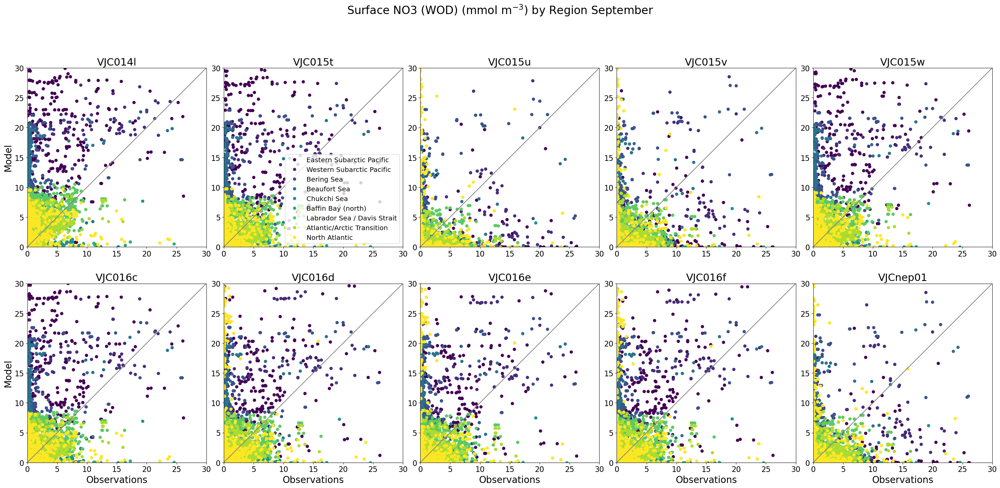

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

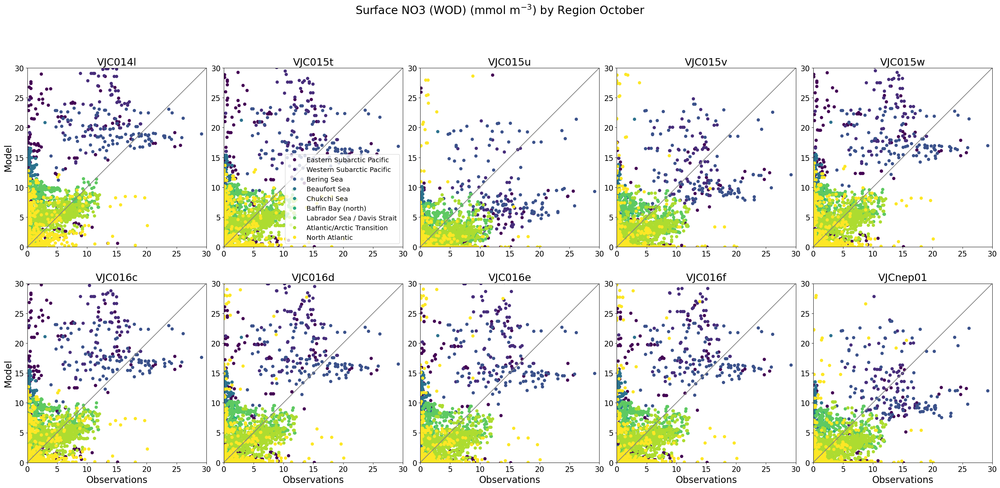

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

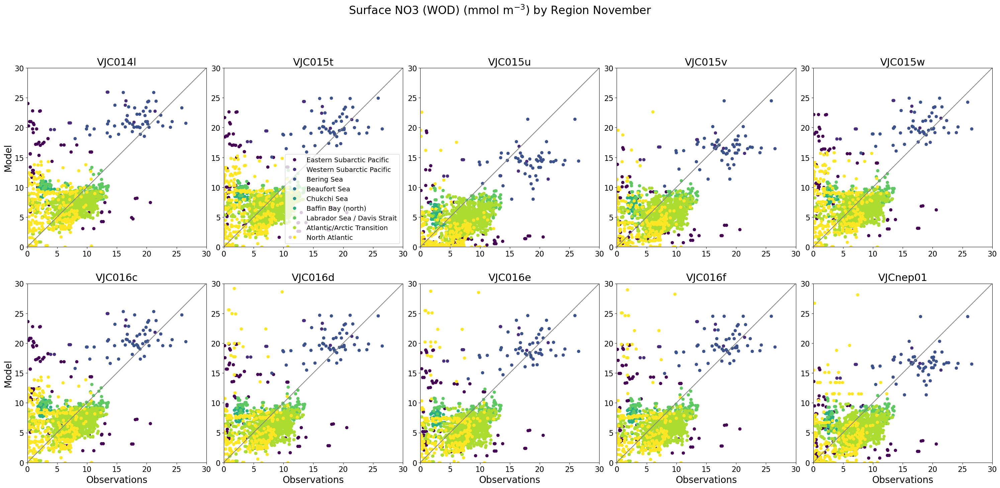

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modNO3 = data.variables['NO3'][:]
/tmp/ipykernel_598046/2069738046.py:34: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `b

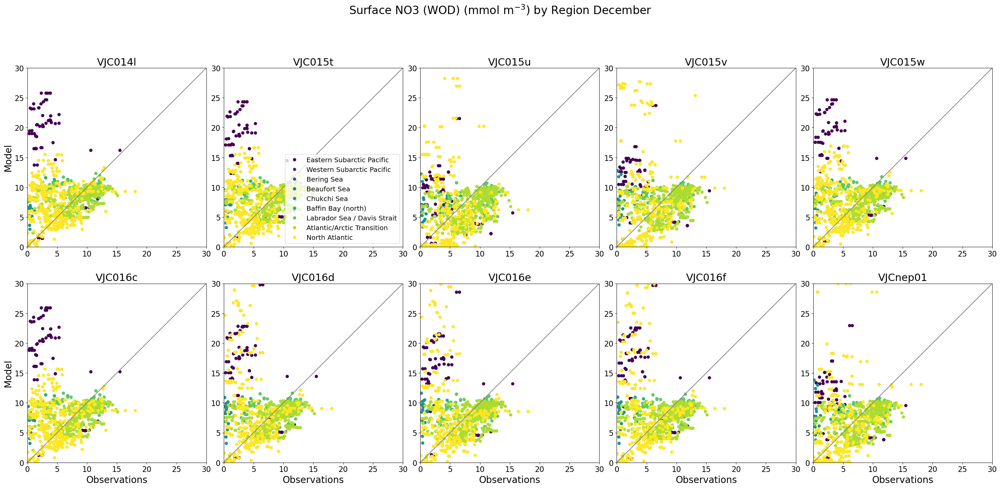

In [5]:
# Presentation quality plot for BioMod Workshop, 016c and d

regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJC016f','VJCnep01']
variantdict = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJC016f','VJCnep01']

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=2, ncols=5, figsize=(30, 15))
    #fig.suptitle('Mean Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24) 
    fig.suptitle('Surface NO3 (WOD) (mmol m$^{-3}$) by Region '+mmon, fontsize=24)
    for a, asuff in enumerate(variants):
        cx=plt.subplot(2,5, a+1)
        runid = str('CREG025_LIM3_CANOE-'+asuff)
        #print(runid)
        data_all=np.zeros((12,nz,ny,nx))
        flist = glob.glob("/home/fid000/WORK7/ANALYSIS/model_evaluation/MonthlyMeans/NO3/"+runid+"_monthly_NO3.nc")
        flist.sort()
        #print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot

        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modNO3 = data.variables['NO3'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsNO3[im,iz,:,:].squeeze().flatten()
                XMOD=modNO3[im,iz,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                #XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=regions)

                #plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
            
            plt.xlim([0, 30]); plt.ylim([0,30])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
            plt.title(variantdict[a], fontsize=22)

            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='x-large', loc = 'lower right')
                
            if (a == 0) or (a == 5):
                plt.ylabel("Model", fontsize=20)

            if (a==5) or (a == 6) or (a == 7) or (a == 8) or (a==9):
                plt.xlabel("Observations", fontsize=20)

        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcdef/NO3_WOD/NO3_WOD_means_month"+str("{:02d}".format(im+1)))
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcdef/NO3_WOD/NO3_WOD_month"+str("{:02d}".format(im+1)))